<a href="https://colab.research.google.com/github/tt35/AI_Tranformers_vs_Fastai/blob/main/Final_Project_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Transformers vs. Fastai in image classification task - Part1**
### Which one is better and more suitable for learning?





## Project Overview and Goal

In CS 344, a class about Artificial Intelligence at Calvin University, students use Fast.ai library to do image classification. During the conversation with the course instructor, he told me that he is planning to shift from Fast.ai to Transformers for image classification tasks. While the Transformer architecture has become the standard for natural language processing tasks such as such as sentiment analysis and text summarization, they can be applied to all sorts of other domains. One of the most revolutionary developments is the Vision Transformer. 

According to “[An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale](https://arxiv.org/abs/2010.11929)”, a paper written by researchers at Google Brain in 2021, the Vision Transformer (ViT) is a model for image classification that employs a Transformer-like architecture over patches of the image. An image is split into fixed-size patches, each of them are then linearly embedded, position embeddings are added, and the resulting sequence of vectors is fed to a standard Transformer encoder. In order to perform classification, the standard approach of adding an extra learnable “classification token” to the sequence is used. The fine-tuning code and pre-trained ViT models are available at their [GitHub page](https://github.com/google-research/vision_transformer), and the models are pre-trained on the ImageNet and ImageNet-21k datasets.

One significant difference is that ViT does not depend on convolutional networks unlike most of the other models that exist today. According to the [blog post](https://viso.ai/deep-learning/vision-transformer-vit/) by viso.ai, while CNN uses pixel arrays, ViT divides the images into visual tokens to perform image classification. The ViT splits an image into fixed-size patches, embeds each of them, and includes positional embedding as an input to the transformer encoder. In terms of computational efficiency and accuracy, ViT models performs better than CNN models by almost four times.
The goal of this project is to redo the [Homework 3](https://cs.calvin.edu/courses/cs/344/22sp/units/03models/homework/) from CS 344 with using the ViT models instead of Fast.ai. Then, I would like to compare the accuracy and easiness of implementing each model. I used this [Hugging Face blog post](https://huggingface.co/blog/fine-tune-vit) as a reference to complete image classification using Transformers. 


## Install necessary packages

In [ ]:
from datasets import load_dataset, DatasetDict, load_from_disk
import random
from PIL import ImageDraw, ImageFont, Image
from transformers import ViTFeatureExtractor
import torch
import numpy as np
from datasets import load_metric
from transformers import ViTForImageClassification
from transformers import TrainingArguments
from transformers import Trainer

## Load a dataset

For this project, I decided to use pictures taken by the students in CS 344. Students were asked to share the pictures of two buildings of their choice in the [folder in their class Team](https://calvincollege.sharepoint.com/sites/Section_81629/Shared%20Documents/Forms/AllItems.aspx?id=%2Fsites%2FSection%5F81629%2FShared%20Documents%2FGeneral%2FHW2%20Photos&p=true&ga=1). 

I downloaded pictures of Science Building (SB) and Covenant Fine Arts Center (CFAC) because they are the ones that many students chose. I downloaded 120 pictures of SB and 48 pictures of CFAC, and I put them into a folder named pics_transformers. Then, I divided the pictures into three subfolders, which are train, test, and validation. Each subfolder also contains another folder for both SB and CFAC. I put 80% of the images to the train folder and 20% to the test folder. Then, I put 20% of the pictures in the train set into the validation folder. At the end, train/SB contains 77 images and train/CF contains 30 images. It is 24 for test/SB, 10 for test/CF, 19 for validation/SB, and 8 for validation/CF.


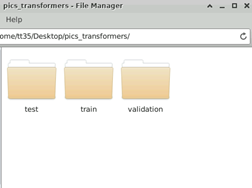
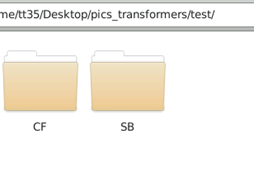

In [ ]:
ds = DatasetDict({
    "train": load_dataset("imagefolder", data_dir= '/home/tt35/Desktop/pics_transformers/train', split='train'),
    "test": load_dataset("imagefolder", data_dir= '/home/tt35/Desktop/pics_transformers/test', split='train'),
    "validation": load_dataset("imagefolder", data_dir= '/home/tt35/Desktop/pics_transformers/validation', split='train')})

Resolving data files:   0%|          | 0/107 [00:00<?, ?it/s]

Using custom data configuration default-ac41a5ade1cccd36
Reusing dataset image_folder (/scratch/cs344/huggingface/datasets/image_folder/default-ac41a5ade1cccd36/0.0.0/ee92df8e96c6907f3c851a987be3fd03d4b93b247e727b69a8e23ac94392a091)


Resolving data files:   0%|          | 0/34 [00:00<?, ?it/s]

Using custom data configuration default-73eb95b38a320fdb
Reusing dataset image_folder (/scratch/cs344/huggingface/datasets/image_folder/default-73eb95b38a320fdb/0.0.0/ee92df8e96c6907f3c851a987be3fd03d4b93b247e727b69a8e23ac94392a091)


Resolving data files:   0%|          | 0/27 [00:00<?, ?it/s]

Using custom data configuration default-a28225d917e12e11
Reusing dataset image_folder (/scratch/cs344/huggingface/datasets/image_folder/default-a28225d917e12e11/0.0.0/ee92df8e96c6907f3c851a987be3fd03d4b93b247e727b69a8e23ac94392a091)


In [ ]:
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 107
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 34
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 27
    })
})

Here you can see that the dataset has train, test, validation sets in it. 

Let's take a look at the 8th example from the train split from the dataset. There are two features:

1. image: A PIL image
2. label: Integer representation of the label

In [ ]:
train_ex = ds['train'][8]
train_ex

{'image': <PIL.MpoImagePlugin.MpoImageFile image mode=RGB size=3024x3024 at 0x7FE1042C7DC0>,
 'label': 0}

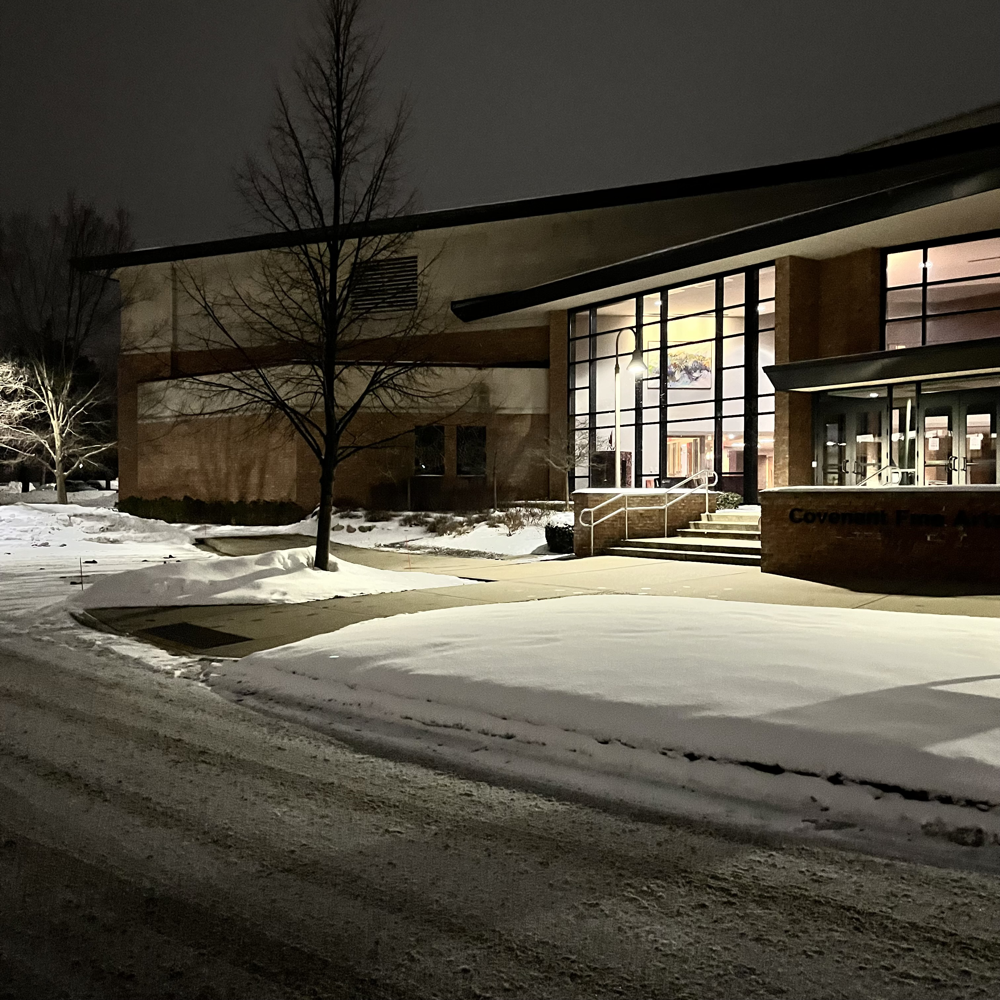

In [ ]:
image = train_ex['image']
image

I can confirm that the picture above is CFAC by using `int2str` function, which allows to pass the integer representation of the class to look up the string label. 

In [ ]:
# Access the feature definition for the 'label'.
label = ds['train'].features['label']
label

ClassLabel(num_classes=2, names=['CF', 'SB'], id=None)

In [ ]:
label.int2str(train_ex['label'])

'CF'

The code below shows a grid of examples from each class.

Loading cached processed dataset at /scratch/cs344/huggingface/datasets/image_folder/default-ac41a5ade1cccd36/0.0.0/ee92df8e96c6907f3c851a987be3fd03d4b93b247e727b69a8e23ac94392a091/cache-4c9dbc0f8ab3e148.arrow
Loading cached processed dataset at /scratch/cs344/huggingface/datasets/image_folder/default-ac41a5ade1cccd36/0.0.0/ee92df8e96c6907f3c851a987be3fd03d4b93b247e727b69a8e23ac94392a091/cache-3900b03c1ef4fbd3.arrow


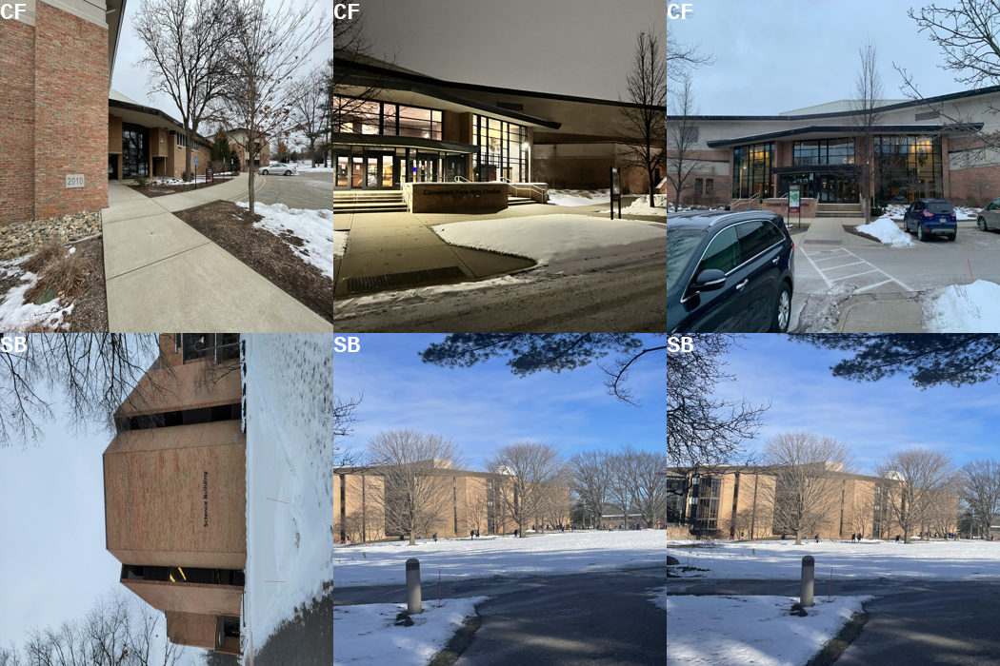

In [ ]:
def show_examples(ds, seed: int = 1234, examples_per_class: int = 3, size=(350, 350)):

    w, h = size
    labels = ds['train'].features['label'].names
    grid = Image.new('RGB', size=(examples_per_class * w, len(labels) * h))
    draw = ImageDraw.Draw(grid)
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf", 24)

    for label_id, label in enumerate(labels):

        # Filter the dataset by a single label, shuffle it, and grab a few samples
        ds_slice = ds['train'].filter(lambda ex: ex['label'] == label_id).shuffle(seed).select(range(examples_per_class))

        # Plot this label's examples along a row
        for i, example in enumerate(ds_slice):
            image = example['image']
            idx = examples_per_class * label_id + i
            box = (idx % examples_per_class * w, idx // examples_per_class * h)
            grid.paste(image.resize(size), box=box)
            draw.text(box, label, (255, 255, 255), font=font)

    return grid

show_examples(ds, seed=random.randint(0, 1337), examples_per_class=3)

There are some varieties in the pictures. For example, some of them were taken during daytime when the sun is out while others were taken at night. Some pictures have clear sky, while others have gloomy sky. Some of the pictures of CFAC have cars in them. Also, all the pictures were taken during winter, so you can see some snow in the pictures. These varieties might bring limitations as they can influence the model performance. For example, the model might connect the images of cars with CFAC.

## Loading ViT feature extractor

Hugging Face has a lot of pretrained models and pipelines for a variety of tasks such as NLP and Computer Vision.

For this project, I used [vit-base-patch-224-in21k](https://huggingface.co/google/vit-base-patch16-224-in21k) as a base model on which I will do a fine-turning. It is a model that is pre-trained on ImageNet-21k (14 million images, 21,843 classes) at resolution 224x224.

You can find more available models that can be used for image classification [here](https://huggingface.co/models?library=pytorch&pipeline_tag=image-classification&sort=downloads&search=vit).

In [ ]:
model_name_or_path = 'google/vit-base-patch16-224-in21k'
feature_extractor = ViTFeatureExtractor.from_pretrained(model_name_or_path)

## Processing the dataset

In [ ]:
def transform(example_batch):
    # Take a list of PIL images and turn them to pixel values
    inputs = feature_extractor([x for x in example_batch['image']], return_tensors='pt')

    # Include the labels
    inputs['label'] = example_batch['label']
    return inputs

In [ ]:
prepared_ds = ds.with_transform(transform)

Now that the data is processed, but there are a few things that must be set up before setting up the training pipeline.

Here are the lists:

- Define a collate function.


- Define an evaluation metric.


- Load a pretrained checkpoint.


- Define the training configuration.

### Define data collator

In [ ]:
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['label'] for x in batch])
    }

### Define an evaluation metric

I am going to use `accuracy` as an evaluation metric, which shows the proportion of correct predictions among the total number of cases processed.

In [ ]:
metric = load_metric("accuracy")
def compute_metrics(p):
    return metric.compute(predictions=np.argmax(p.predictions, axis=1), references=p.label_ids)

###  Load the pretrained model

Now, let's load the pretrained model. I added `num_labels` so the model creates a classification head with the right number of units. I also included the `id2label` and `label2id` mappings to have human-readable labels in the Hub widget.

In [ ]:
labels = ds['train'].features['label'].names

model = ViTForImageClassification.from_pretrained(
    model_name_or_path,
    num_labels=len(labels),
    id2label={str(i): c for i, c in enumerate(labels)},
    label2id={c: str(i) for i, c in enumerate(labels)}
)

Some weights of the model checkpoint at google/vit-base-patch16-224-in21k were not used when initializing ViTForImageClassification: ['pooler.dense.bias', 'pooler.dense.weight']
- This IS expected if you are initializing ViTForImageClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing ViTForImageClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Model Training

There are some parameter values that I could choose. For example, I set batch size to 8, the number of epochs to 3, and learning rate to 2e-4.

In [ ]:
training_args = TrainingArguments(
  output_dir="./vit-base",
  per_device_train_batch_size=8,
  evaluation_strategy="steps",
  num_train_epochs=3,
  fp16=True,
  save_steps=100,
  eval_steps=100,
  logging_steps=10,
  learning_rate=2e-4,
  save_total_limit=2,
  remove_unused_columns=False,
  push_to_hub=False,
  report_to='tensorboard',
  load_best_model_at_end=True,
)

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=prepared_ds["train"],
    eval_dataset=prepared_ds["validation"],
    tokenizer=feature_extractor,
)

Using amp half precision backend


In [ ]:
random.seed(100)
train_results = trainer.train()
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

/home/tt35/.local/lib/python3.9/site-packages/transformers/optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
***** Running training *****
  Num examples = 107
  Num Epochs = 3
  Instantaneous batch size per device = 8
  Total train batch size (w. parallel, distributed & accumulation) = 8
  Gradient Accumulation steps = 1
  Total optimization steps = 42


Step,Training Loss,Validation Loss




Training completed. Do not forget to share your model on huggingface.co/models =)


Saving model checkpoint to ./vit-base
Configuration saved in ./vit-base/config.json
Model weights saved in ./vit-base/pytorch_model.bin
Feature extractor saved in ./vit-base/preprocessor_config.json


***** train metrics *****
  epoch                    =        3.0
  total_flos               = 23166582GF
  train_loss               =     0.1572
  train_runtime            = 0:00:30.35
  train_samples_per_second =     10.574
  train_steps_per_second   =      1.384


### Model Testing and Evaluation

In [ ]:
metrics = trainer.evaluate(prepared_ds['test'])
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

***** Running Evaluation *****
  Num examples = 34
  Batch size = 8


***** eval metrics *****
  epoch                   =        3.0
  eval_accuracy           =        1.0
  eval_loss               =     0.0233
  eval_runtime            = 0:00:03.05
  eval_samples_per_second =     11.145
  eval_steps_per_second   =      1.639


### Result (accuracy on the test data) 

I tested on 4 different seed, and the results are show below. It is quite impressive that the model has the accuracy of 1.0 most of the time, and even when it does not, it still has 0.88.

```
seed = 1: 
  epoch                   =        3.0
  eval_accuracy           =        1.0
  eval_loss               =     0.0007
  eval_runtime            = 0:00:03.07
  eval_samples_per_second =     11.048
  eval_steps_per_second   =      1.625
  
seed = 10:
  epoch                   =        3.0
  eval_accuracy           =        1.0
  eval_loss               =     0.0007
  eval_runtime            = 0:00:03.03
  eval_samples_per_second =     11.218
  eval_steps_per_second   =       1.65
  
seed = 100:
  epoch                   =        3.0
  eval_accuracy           =        1.0
  eval_loss               =     0.0007
  eval_runtime            = 0:00:03.14
  eval_samples_per_second =      10.81
  eval_steps_per_second   =       1.59
  
seed = 1000:
  epoch                   =        3.0
  eval_accuracy           =     0.8824
  eval_loss               =     0.4706
  eval_runtime            = 0:00:03.09
  eval_samples_per_second =     10.999
  eval_steps_per_second   =      1.617
  ```